In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/deep-learning/ex.csv
/kaggle/input/deep-learning/mushroom_cleaned.csv
/kaggle/input/deep-learning/iris.csv
/kaggle/input/deep-learning/fake_real_news/fake_real_news/True.csv
/kaggle/input/deep-learning/fake_real_news/fake_real_news/fake_or_real_news.csv
/kaggle/input/deep-learning/fake_real_news/fake_real_news/Fake.csv
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/ReadMe.txt
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/right/chualsr2.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/right/chualsr3.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/right/chualsr5.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/right/chualsr1.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/right/chualsr4.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/left/chualsl4.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/left/chualsl3.bmp
/kaggle/input/deep-learning/eyes/MMU-Iris-Database/7/left/chualsl5.bmp
/kaggle/input/deep-learning/ey

# Setup

In [2]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [3]:
!pip install --upgrade tensorflow-decision-forests tensorflow-text tf-keras
!pip install tensorflow==2.17.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 84.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 75.5 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: keras
    Found existing installation: keras 3.3.3
    Uninstalling keras-3.3.3:
      Succes

In [4]:
import tensorflow as tf
tf.__version__

2024-11-23 05:50:52.058750: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-23 05:50:52.080583: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-23 05:50:52.087216: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


'2.17.0'

In [5]:
tf.config.optimizer.set_experimental_options({"layout_optimizer": False})

In [6]:
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-3od3ovbe
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-3od3ovbe
  Resolved https://github.com/tensorflow/docs to commit bbc0b9c70fc0bd4411793d1b0bcc56ef1dbc2405
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2024.11.18.43811-py3-none-any.whl size=186673 sha256=b265039855e5d473a261993fe99756944cd825a108acd6ba3fb46e36e21044c3
  Stored in directory: /tmp/pip-ephem-wheel-cache-e3ellzgk/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs


In [7]:
import glob
#import imageio
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from PIL import Image
from tensorflow.keras import layers
import time
import pathlib

from IPython import display

# Extraccion y preparacion base de datos

In [8]:
# /kaggle/input/deep-learning/eyes/MMU-Iris-Database
dir_eyes = "/kaggle/input/deep-learning/eyes/MMU-Iris-Database/"

In [9]:
archivos_bmp = glob.glob(dir_eyes + '**/*.bmp', recursive=True)
print(f"Se encontraron {len(archivos_bmp)} imágenes .bmp")

Se encontraron 450 imágenes .bmp


In [10]:
#batch_size = 56
img_altura = 28
img_ancho = 28

In [11]:
imagenes = []
for archiv in archivos_bmp:
    img = Image.open(archiv)
    #img = img.resize((28, 28))
    img = img.resize((img_altura, img_ancho))
    img = img.convert('L')
    imagenes.append(np.array(img))

In [12]:
imagenes = np.array(imagenes)
#train_img = imagenes.reshape(imagenes.shape[0], 28, 28, 1).astype('float32')
train_img = imagenes.reshape(imagenes.shape[0], img_altura, img_ancho, 1).astype('float32')
#train_img = (train_img - 127.5) / 127.5  # Normalize the images to [-1, 1]
train_img = (train_img/127.5) - 1  # Normalize the images to [-1, 1]

#train_img = tf.convert_to_tensor(train_imgs)

# Asegúrate de que el tensor tenga la forma correcta [num_images, 224, 224, 1]
#train_img = tf.reshape(train_img, [-1, 224, 224, 1])
print(len(train_img))

450


In [13]:
BUFFER_SIZE = len(train_img)
if img_altura == 28:
    BATCH_SIZE = 2
elif img_altura == 244:
    BATCH_SIZE = 225

In [14]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(train_img).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

I0000 00:00:1732341082.249718      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732341082.397160      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732341082.397541      23 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732341082.400195      23 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

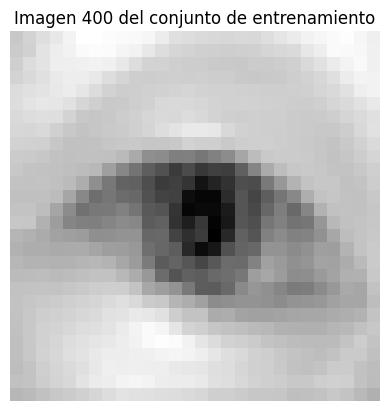

In [15]:
i = 400
image = train_img[i]
image = (image * 127.5) + 127.5
image = image.astype(np.uint8)

# Mostrar la imagen
plt.imshow(image, cmap='gray')
plt.axis('off')  # Ocultar los ejes
plt.title(f'Imagen {i} del conjunto de entrenamiento')
plt.show()

# Creacion de modelos

## Generador

In [16]:
def make_generator_model():
    model = tf.keras.Sequential()
    
    if img_altura == 28:
        model.add(layers.Dense(7 * 7 * 256, use_bias=False, input_shape=(100,)))
    elif img_altura == 244:
        model.add(layers.Dense(7 * 7 * 256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256)

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    if img_altura == 28:
        model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
        assert model.output_shape == (None, 28, 28, 1)
        
        return model
        
    elif img_altura == 244:
        model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 28, 28, 32)
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU())

        model.add(layers.Conv2DTranspose(16, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 56, 56, 16)
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU())

        model.add(layers.Conv2DTranspose(8, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 112, 112, 8)
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU())
    
        model.add(layers.Conv2DTranspose(4, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        assert model.output_shape == (None, 224, 224, 4)
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU())

        model.add(layers.Conv2DTranspose(1, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh'))
        assert model.output_shape == (None, 224, 224, 1)
    
        return model

In [17]:
generator = make_generator_model()

generator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 12544)          │     1,254,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 12544)          │        50,176 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 7, 7, 128)      │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 7, 7, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 14, 14, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 14, 14, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 28, 28, 1)      │         1,600 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,330,944 (8.89 MB)

 Trainable params: 2,305,472 (8.79 MB)

 Non-trainable params: 25,472 (99.50 KB)

W0000 00:00:1732341084.970208      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.014936      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.015632      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.026475      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.045816      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.065912      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.067850      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.121363      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.122015      23 gp

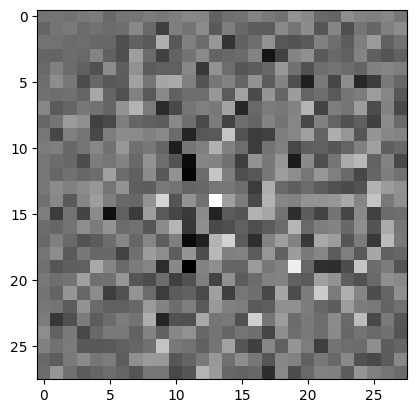

In [18]:
if img_altura == 28:
    noise = tf.random.normal([1, 100])
elif img_altura == 244:
    noise = tf.random.normal([1, 100])
    
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

## Discriminador

In [19]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[img_altura, img_ancho, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    print("Shape after Conv2D 1:", model.output_shape)
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    print("Shape after Conv2D 2:", model.output_shape)
    
    if img_altura == 28:
        model.add(layers.Flatten())
        print("Shape after Flatten:", model.output_shape)
    
        model.add(layers.Dense(1))
        print("Shape after Dense:", model.output_shape)
    
        return model
    
    elif img_altura == 244:
        model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))
        print("Shape after Conv2D 3:", model.output_shape)

        model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))
        print("Shape after Conv2D 4:", model.output_shape)

        model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))
        print("Shape after Conv2D 5:", model.output_shape)

        model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
        model.add(layers.LeakyReLU())
        model.add(layers.Dropout(0.3))
        print("Shape after Conv2D 6:", model.output_shape)
    
        model.add(layers.Flatten())
        print("Shape after Flatten:", model.output_shape)
    
        model.add(layers.Dense(1))
        print("Shape after Dense:", model.output_shape)
    
        return model

In [20]:
discriminator = make_discriminator_model()

discriminator.summary()

Shape after Conv2D 1: (None, 14, 14, 64)
Shape after Conv2D 2: (None, 7, 7, 128)
Shape after Flatten: (None, 6272)
Shape after Dense: (None, 1)


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 14, 14, 64)     │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         6,273 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 212,865 (831.50 KB)

 Trainable params: 212,865 (831.50 KB)

 Non-trainable params: 0 (0.00 B)

In [21]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print(decision)

W0000 00:00:1732341085.807676      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced


Shape after Conv2D 1: (None, 14, 14, 64)
Shape after Conv2D 2: (None, 7, 7, 128)
Shape after Flatten: (None, 6272)
Shape after Dense: (None, 1)
tf.Tensor([[0.00046877]], shape=(1, 1), dtype=float32)


W0000 00:00:1732341085.824088      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.837194      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.837746      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.849772      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.881118      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.881689      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.882253      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.882882      23 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1732341085.883447      23 gp

# Pérdida y los optimizadores

In [22]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## Perdida del Discrimidor

In [23]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

## Perdida del Generador

In [24]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [25]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## Guardar Checkpoints

In [26]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Bucle de entrenamiento

In [27]:
if img_altura == 28:
    EPOCHS = 225
    noise_dim = 100
elif img_altura == 244:
    EPOCHS = 225
    noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [28]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [29]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    #if (epoch + 1) % 15 == 0:
    #  checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

In [30]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

# Entrenamiento del model

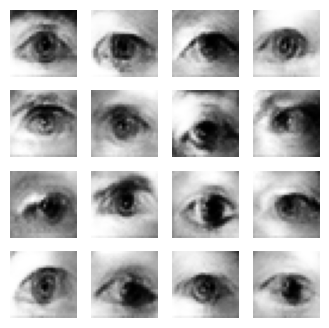

In [31]:
train(train_dataset, EPOCHS)

In [32]:
#checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Creacion del GIF

In [33]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

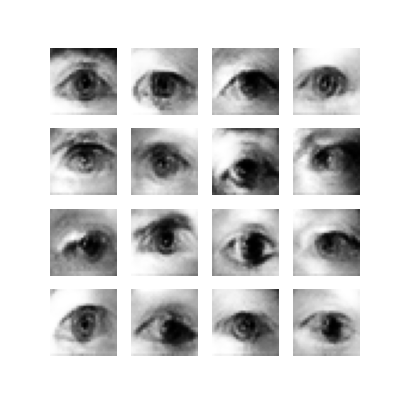

In [34]:
display_image(EPOCHS)

In [35]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


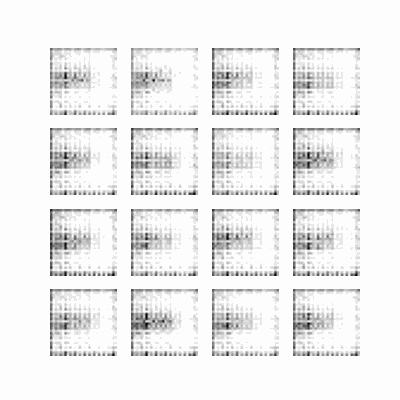

In [36]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [37]:
import base64

# Leer el archivo GIF y convertirlo a base64
with open(anim_file, "rb") as image_file:
    encoded_string = base64.b64encode(image_file.read()).decode('utf-8')


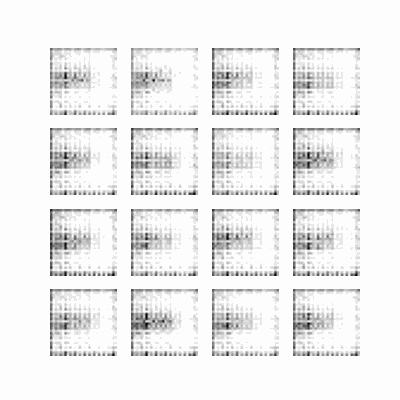

In [38]:
from IPython.display import HTML

def create_download_link(encoded_string, filename):
    html = f'<a download="{filename}" href="data:image/gif;base64,{encoded_string}" target="_blank">Descargar GIF</a>'
    return HTML(html)

# Mostrar el enlace de descarga
create_download_link(encoded_string, f"Eyes_{img_altura}x{img_ancho}_E{EPOCHS}_BuS{450}_BaS{BATCH_SIZE}.gif")